# Loading Data for Inference

In [4]:
import ee
import geemap

# Initialize Earth Engine
try:
    ee.Initialize(project="desertification-risk")
except Exception as e:
    ee.Authenticate()
    ee.Initialize(project="desertification-risk")

print("[*] Fetching Hyderabad Geometry...")
pakistan_districts = ee.FeatureCollection("FAO/GAUL/2015/level2")
hyderabad = pakistan_districts.filter(ee.Filter.eq('ADM2_NAME', 'Hyderabad'))
roi = hyderabad.geometry()

# Define the timeframe for our baseline assessment
m_start = ee.Date('2026-02-01')
m_end = ee.Date('2026-03-01')

print("[*] Compositing 33-band satellite features...")

# --- 1. Sentinel-1 ---
dummy_s1 = ee.Image.constant([0, 0]).rename(['VV', 'VH']).updateMask(0)
s1_col = ee.ImageCollection('COPERNICUS/S1_GRD').filterBounds(roi).filterDate(m_start, m_end) \
            .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')) \
            .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH')) \
            .filter(ee.Filter.eq('instrumentMode', 'IW')).select(['VV', 'VH'])
s1 = s1_col.merge(ee.ImageCollection([dummy_s1])).median()
s1_vv = s1.select('VV').unmask(-30).rename('S1_VV')
s1_vh = s1.select('VH').unmask(-30).rename('S1_VH')
s1_ratio = s1_vh.subtract(s1_vv).rename('S1_Ratio')

# --- 2. Sentinel-2 ---
def mask_s2_clouds(image):
    scl = image.select('SCL')
    mask = scl.neq(3).And(scl.neq(8)).And(scl.neq(9)).And(scl.neq(10))
    return image.updateMask(mask).divide(10000)

dummy_s2 = ee.Image.constant([0, 0, 0, 0]).rename(['B2', 'B4', 'B8', 'B11']).updateMask(0)
s2_col = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED').filterBounds(roi).filterDate(m_start, m_end) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 60))
s2_mapped = s2_col.map(mask_s2_clouds).select(['B2', 'B4', 'B8', 'B11'])
s2 = s2_mapped.merge(ee.ImageCollection([dummy_s2])).median().unmask(0)
s2_bands = s2.rename(['Blue', 'Red', 'NIR', 'SWIR'])

ndvi = s2_bands.normalizedDifference(['NIR', 'Red']).rename('NDVI')
ndwi = s2_bands.normalizedDifference(['NIR', 'SWIR']).rename('NDWI')
msi = s2_bands.select('SWIR').divide(s2_bands.select('NIR').add(1e-6)).rename('MSI')
nddi = ndvi.subtract(ndwi).divide(ndvi.add(ndwi).add(1e-6)).rename('NDDI')
savi = s2_bands.expression('((NIR - RED) / (NIR + RED + 0.5)) * 1.5', {'NIR': s2_bands.select('NIR'), 'RED': s2_bands.select('Red')}).rename('SAVI')
evi = s2_bands.expression('2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))', {'NIR': s2_bands.select('NIR'), 'RED': s2_bands.select('Red'), 'BLUE': s2_bands.select('Blue')}).rename('EVI')

# --- 3. MODIS ---
dummy_lst = ee.Image.constant(0).rename('LST_Day_1km').updateMask(0)
lst = ee.ImageCollection("MODIS/061/MOD11A2").filterBounds(roi).filterDate(m_start, m_end).select('LST_Day_1km')
lst_celsius = lst.merge(ee.ImageCollection([dummy_lst])).median().multiply(0.02).subtract(273.15).unmask(0).rename('MODIS_LST')

dummy_et = ee.Image.constant(0).rename('ET').updateMask(0)
et = ee.ImageCollection("MODIS/061/MOD16A2").filterBounds(roi).filterDate(m_start, m_end).select('ET')
et_modis = et.merge(ee.ImageCollection([dummy_et])).sum().unmask(0).rename('MODIS_ET')

dummy_lai = ee.Image.constant(0).rename('Lai').updateMask(0)
lai = ee.ImageCollection("MODIS/061/MCD15A3H").filterBounds(roi).filterDate(m_start, m_end).select('Lai')
lai_modis = lai.merge(ee.ImageCollection([dummy_lai])).mean().multiply(0.1).unmask(0).rename('MODIS_LAI')

# --- 4. CHIRPS & TerraClimate ---
dummy_rain = ee.Image.constant(0).rename('precipitation').updateMask(0)
rain = ee.ImageCollection("UCSB-CHG/CHIRPS/DAILY").filterBounds(roi).filterDate(m_start, m_end).select('precipitation')
rain_total = rain.merge(ee.ImageCollection([dummy_rain])).sum().unmask(0).rename('CHIRPS_Rainfall')

dummy_tc = ee.Image.constant([0,0,0,0,0,0]).rename(['pr', 'pet', 'tmmx', 'tmmn', 'vpd', 'pdsi']).updateMask(0)
tc_col = ee.ImageCollection("IDAHO_EPSCOR/TERRACLIMATE").filterBounds(roi).filterDate(m_start, m_end).select(['pr', 'pet', 'tmmx', 'tmmn', 'vpd', 'pdsi'])
tc = tc_col.merge(ee.ImageCollection([dummy_tc])).median().unmask(0)

tc_pr = tc.select('pr').rename('TC_Pr')
tc_pet = tc.select('pet').multiply(0.1).rename('TC_PET')
tc_tmax = tc.select('tmmx').multiply(0.1).rename('TC_Tmax')
tc_tmin = tc.select('tmmn').multiply(0.1).rename('TC_Tmin')
tc_vpd = tc.select('vpd').multiply(0.01).rename('TC_VPD')
tc_pdsi = tc.select('pdsi').multiply(0.01).rename('TC_PDSI')

# --- 5. Static (Soil, Topo, Pop, LC) ---
soc = ee.Image("OpenLandMap/SOL/SOL_ORGANIC-CARBON_USDA-6A1C_M/v02").select('b0').unmask(0).rename('Soil_SOC')
texture = ee.Image("OpenLandMap/SOL/SOL_TEXTURE-CLASS_USDA-TT_M/v02").select('b0').unmask(0).rename('Soil_Texture')
bulk_density = ee.Image("projects/soilgrids-isric/bdod_mean").select('bdod_0-5cm_mean').unmask(0).rename('Soil_BulkDensity')

srtm = ee.Image("USGS/SRTMGL1_003").clip(roi)
elevation = srtm.rename("Topo_Elevation")
slope = ee.Terrain.slope(srtm).rename("Topo_Slope")
aspect = ee.Terrain.aspect(srtm).rename("Topo_Aspect")
hillshade = ee.Terrain.products(srtm).select('hillshade').rename("Topo_Hillshade")

dummy_viirs = ee.Image.constant(0).rename('avg_rad').updateMask(0)
viirs = ee.ImageCollection("NOAA/VIIRS/DNB/MONTHLY_V1/VCMCFG").filterBounds(roi).filterDate(m_start, m_end).select('avg_rad')
night_lights = viirs.merge(ee.ImageCollection([dummy_viirs])).median().unmask(0).rename('VIIRS_NightLights')

pop_dens = ee.ImageCollection("CIESIN/GPWv411/GPW_Population_Density").filterDate('2020-01-01', '2020-12-31').first().select('population_density').unmask(0).rename('Pop_Density')

dummy_lc = ee.Image.constant(7).rename('label').updateMask(0)
dw_col = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1").filterBounds(roi).filterDate(m_start, m_end).select('label')
lc = dw_col.merge(ee.ImageCollection([dummy_lc])).mode().unmask(7).rename('Land_Cover')

# --- 6. Final Stack (33 Channels) ---
input_stack = ee.Image.cat([
    s1_vv, s1_vh, s1_ratio, s2_bands, ndvi, ndwi, msi, nddi, savi, evi,
    lst_celsius, et_modis, lai_modis, rain_total, tc_pr, tc_pet, tc_tmax, tc_tmin, tc_vpd, tc_pdsi,
    soc, texture, bulk_density, elevation, slope, aspect, hillshade, night_lights, pop_dens, lc
]).clip(roi).toFloat()

# Export to Drive
export_name = 'Hyderabad_ModelA_Inputs_Feb2026'
folder_name = 'FYP_Inference'

print(f"[*] Starting Export: {export_name}...")
task = ee.batch.Export.image.toDrive(
    image=input_stack,
    description=export_name,
    folder=folder_name,
    region=roi,
    scale=30, # 30m resolution for full district
    maxPixels=1e13,
    fileFormat='GeoTIFF'
)
task.start()

import time
while task.active():
    print(f"Task status: {task.status()['state']}...")
    time.sleep(15)

if task.status()['state'] == 'COMPLETED':
    print("[*] SUCCESS! GeoTIFF is in your Google Drive.")
else:
    print(f"[!] Failed: {task.status()}")

[*] Fetching Hyderabad Geometry...
[*] Compositing 33-band satellite features...
[*] Starting Export: Hyderabad_ModelA_Inputs_Feb2026...
Task status: READY...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
Task status: RUNNING...
[*] SUCCESS! GeoTIFF is in your Google Drive.


In [5]:
!pip install -q rasterio huggingface_hub

In [9]:
import os
import torch
import numpy as np
import rasterio
from rasterio.windows import Window
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from huggingface_hub import hf_hub_download
import torch.nn as nn
import torch.nn.functional as F

# Defining SindhUNet Architecture

In [10]:
# ============================================================
# ARCHITECTURE — UNet
# ============================================================
class DoubleConv(nn.Module):
    '''
    Two consecutive Conv2d → GroupNorm → SiLU blocks.
    Standard UNet building block.
    '''
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(num_groups=max(1, out_ch // 8), num_channels=out_ch),
            nn.SiLU(),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(num_groups=max(1, out_ch // 8), num_channels=out_ch),
            nn.SiLU(),
        )
    def forward(self, x):
        return self.block(x)


class DownBlock(nn.Module):
    '''DoubleConv → MaxPool2d. Returns both pre-pool (skip) and pooled.'''
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = DoubleConv(in_ch, out_ch)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x):
        skip = self.conv(x)   # full resolution — saved for skip connection
        down = self.pool(skip)
        return skip, down



class UpBlock(nn.Module):
    '''
    ConvTranspose2d upsampling → concat skip → DoubleConv.
    Recovers spatial detail lost during downsampling.
    '''
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.ConvTranspose2d(in_ch, in_ch // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_ch // 2 + skip_ch, out_ch)

    def forward(self, x, skip):
        x = self.up(x)
        # Handle any size mismatch from odd spatial dims
        if x.shape != skip.shape:
            x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)



class SindhUNet(nn.Module):
    '''
    UNet for DSI estimation from 33 satellite channels.

    Architecture:
        Input  (B, 33, 64, 64)
        Enc1   (B, 64,  64, 64)  + skip s1
        Enc2   (B, 128, 32, 32)  + skip s2
        Enc3   (B, 256, 16, 16)  + skip s3
        Enc4   (B, 512,  8,  8)  + skip s4
        Bot    (B, 512,  4,  4)
        Dec4   (B, 256,  8,  8)  + s4
        Dec3   (B, 128, 16, 16)  + s3
        Dec2   (B,  64, 32, 32)  + s2
        Dec1   (B,  32, 64, 64)  + s1
        Head   (B,   1, 64, 64)  sigmoid → DSI in [0,1]

    Parameters: ~7.7M (well within T4 memory budget)
    '''

    def __init__(self, in_channels=33, base_ch=64):
        super().__init__()

        # --- Encoder ---
        self.enc1 = DownBlock(in_channels, base_ch)        # 64  → 32
        self.enc2 = DownBlock(base_ch,     base_ch * 2)    # 32  → 16
        self.enc3 = DownBlock(base_ch * 2, base_ch * 4)    # 16  →  8
        self.enc4 = DownBlock(base_ch * 4, base_ch * 8)    #  8  →  4

        # --- Bottleneck ---
        self.bottleneck = DoubleConv(base_ch * 8, base_ch * 8)

        # --- Decoder ---
        self.dec4 = UpBlock(base_ch * 8, base_ch * 8, base_ch * 4)
        self.dec3 = UpBlock(base_ch * 4, base_ch * 4, base_ch * 2)
        self.dec2 = UpBlock(base_ch * 2, base_ch * 2, base_ch)
        self.dec1 = UpBlock(base_ch,     base_ch,     base_ch // 2)

        # --- Output head ---
        self.head = nn.Sequential(
            nn.Conv2d(base_ch // 2, 1, kernel_size=1),
            nn.Sigmoid()   # DSI is in [0, 1] by construction
        )

    def forward(self, x):
        '''
        x: (B, 33, 64, 64)
        Returns: (B, 1, 64, 64)  DSI prediction in [0, 1]
        '''
        # Encoder
        s1, x = self.enc1(x)   # s1: (B, 64, 64, 64),  x: (B, 64, 32, 32)
        s2, x = self.enc2(x)   # s2: (B,128, 32, 32),  x: (B,128, 16, 16)
        s3, x = self.enc3(x)   # s3: (B,256, 16, 16),  x: (B,256,  8,  8)
        s4, x = self.enc4(x)   # s4: (B,512,  8,  8),  x: (B,512,  4,  4)

        # Bottleneck
        x = self.bottleneck(x)  # (B, 512, 4, 4)

        # Decoder
        x = self.dec4(x, s4)   # (B, 256,  8,  8)
        x = self.dec3(x, s3)   # (B, 128, 16, 16)
        x = self.dec2(x, s2)   # (B,  64, 32, 32)
        x = self.dec1(x, s1)   # (B,  32, 64, 64)

        # Head
        return self.head(x)    # (B, 1, 64, 64)



# Loading Weights and Inferencing

In [13]:


# --- 1. CONFIGURATION ---
TIFF_PATH = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"
OUTPUT_PATH = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif"
CHECKPOINT_DIR = "/content/checkpoints"
HF_REPO = "ahmedfarazsyk/Sindh-Desertification-UNet-ModelA" # Your repo
PATCH_SIZE = 64
BATCH_SIZE = 128

os.makedirs(CHECKPOINT_DIR, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- 2. LOAD MODEL & NORMALIZATIONS ---
print("[*] Downloading model and normalizations from HuggingFace...")
for fname in ["unet_best.pth", "unet_mean.pt", "unet_std.pt"]:
    if not os.path.exists(os.path.join(CHECKPOINT_DIR, fname)):
        hf_hub_download(repo_id=HF_REPO, filename=fname, local_dir=CHECKPOINT_DIR)

global_mean = torch.load(os.path.join(CHECKPOINT_DIR, "unet_mean.pt")).to(device)
global_std = torch.load(os.path.join(CHECKPOINT_DIR, "unet_std.pt")).to(device)

# Load the architecture (Assuming SindhUNet is defined in your Colab session)
model = SindhUNet(in_channels=33, base_ch=64).to(device)
model.load_state_dict(torch.load(os.path.join(CHECKPOINT_DIR, "unet_best.pth"), map_location=device))
model.eval()
print("[*] Model loaded successfully.")

# --- 3. LIVE GEOTIFF DATASET ---
class LiveGeoTIFFDataset(Dataset):
    def __init__(self, tiff_path, patch_size=64):
        self.tiff_path = tiff_path
        self.patch_size = patch_size
        with rasterio.open(tiff_path) as src:
            self.H, self.W = src.height, src.width

        # Calculate grid size
        self.rows = int(np.ceil(self.H / patch_size))
        self.cols = int(np.ceil(self.W / patch_size))
        self.total_patches = self.rows * self.cols

    def __len__(self):
        return self.total_patches

    def __getitem__(self, idx):
        r = idx // self.cols
        c = idx % self.cols
        y = r * self.patch_size
        x = c * self.patch_size

        with rasterio.open(self.tiff_path) as src:
            window = Window(x, y, self.patch_size, self.patch_size)
            # boundless=True handles edge padding automatically!
            data = src.read(window=window, boundless=True, fill_value=0.0)

        data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)
        return torch.tensor(data, dtype=torch.float32), r, c

print(f"[*] Preparing Live Inference Dataset...")
dataset = LiveGeoTIFFDataset(TIFF_PATH, patch_size=PATCH_SIZE)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# --- 4. INFERENCE & STITCHING ---
print(f"[*] Starting Inference on {dataset.rows}x{dataset.cols} grid...")
output_dsi = np.zeros((dataset.H, dataset.W), dtype=np.float32)

with torch.no_grad():
    for X, rows, cols in tqdm(dataloader, desc="Predicting Patches"):
        X = X.to(device)

        # Normalize exactly like training
        X = torch.clamp(X, -100.0, 100.0)
        X = (X - global_mean) / (global_std + 1e-8)

        # Predict
        preds = model(X).squeeze(1).cpu().numpy() # Shape: (B, 64, 64)

        # Stitch back into the massive array
        for i in range(len(rows)):
            r, c = rows[i].item(), cols[i].item()
            y, x = r * PATCH_SIZE, c * PATCH_SIZE

            # If we are at the bottom/right edge, crop the padding out of the prediction
            valid_h = min(PATCH_SIZE, dataset.H - y)
            valid_w = min(PATCH_SIZE, dataset.W - x)

            output_dsi[y:y+valid_h, x:x+valid_w] = preds[i, :valid_h, :valid_w]

# --- 5. SAVE GEO-TIFF ---
print(f"[*] Saving final DSI map...")
with rasterio.open(TIFF_PATH) as src:
    out_meta = src.meta.copy()

out_meta.update({
    'count': 1,            # 1 Band (DSI)
    'dtype': 'float32',
    'compress': 'lzw'      # Compress the output
})

with rasterio.open(OUTPUT_PATH, 'w', **out_meta) as dst:
    dst.write(output_dsi, 1)

print(f"[*] Pipeline Complete! Final Risk Map saved to: {OUTPUT_PATH}")

[*] Downloading model and normalizations from HuggingFace...
[*] Model loaded successfully.
[*] Preparing Live Inference Dataset...
[*] Starting Inference on 11x9 grid...


Predicting Patches: 100%|██████████| 1/1 [00:37<00:00, 37.48s/it]

[*] Saving final DSI map...
[*] Pipeline Complete! Final Risk Map saved to: /content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif


# Visualizing Results

[*] Loading GeoTIFFs...
[*] Generating Visualization...


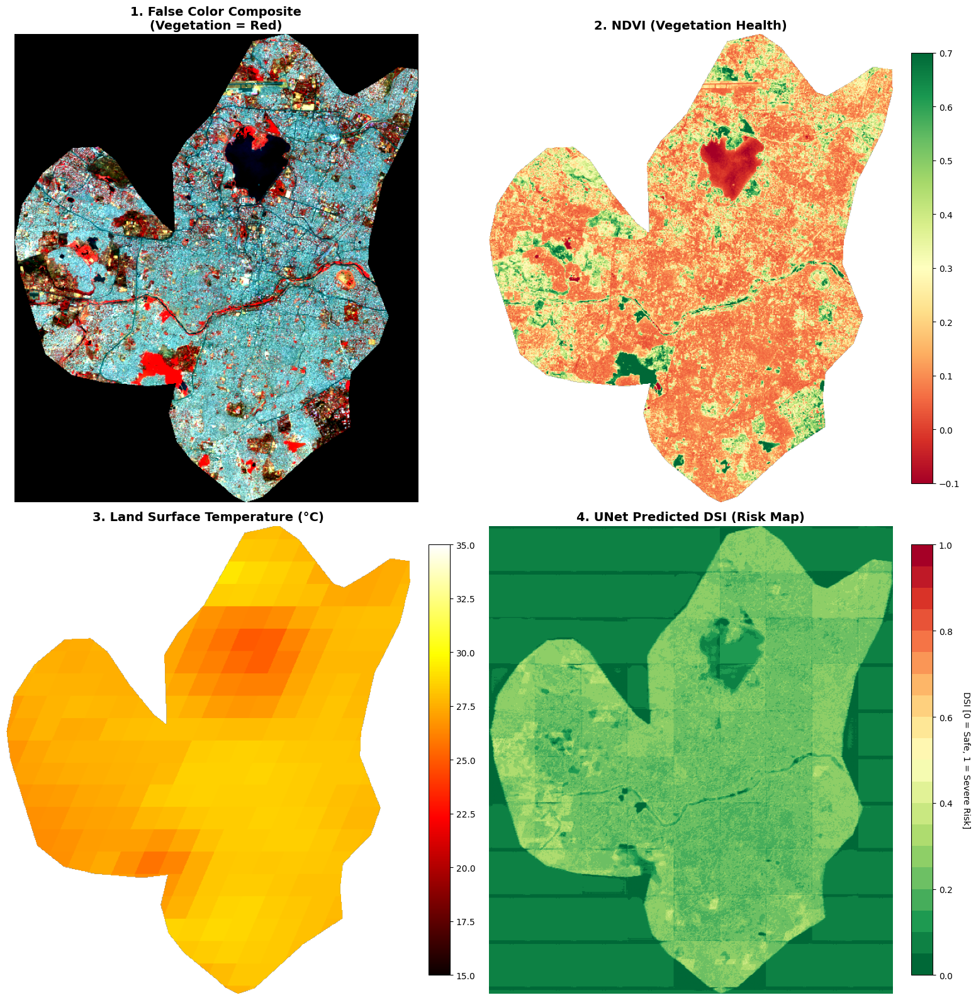

[*] 4-Panel Dashboard saved to Drive.


In [21]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# --- 1. DEFINE PATHS ---
# Update the DSI path to whatever you named your output in the inference script
input_tiff = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"
dsi_tiff   = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif" # Change if named differently


def stretch_rgb(bands_array):
    out = np.zeros_like(bands_array, dtype=np.float32)
    for i in range(3):
        band = np.nan_to_num(bands_array[i]) # Clean NaNs
        valid_pixels = band[band > 0]
        if len(valid_pixels) > 0:
            # Use 5% and 95% to aggressively ignore bright outliers
            vmin, vmax = np.percentile(valid_pixels, (5, 95))
            if vmax > vmin:
                out[i] = np.clip((band - vmin) / (vmax - vmin), 0, 1)
    return np.transpose(out, (1, 2, 0))

# --- 3. LOAD DATA ---
print("[*] Loading GeoTIFFs...")

with rasterio.open(input_tiff) as src:
    # Our input stack order: 1:VV, 2:VH, 3:Ratio, 4:Blue, 5:Red, 6:NIR, 7:SWIR...
    # False Color Composite standard: R=NIR(6), G=Red(5), B=Blue(4)
    nir  = src.read(6)
    red  = src.read(5)
    blue = src.read(4)

    # Stack and stretch
    fcc_stack = np.stack([nir, red, blue])
    fcc_image = stretch_rgb(fcc_stack)

    # Create a mask so the empty padded background stays white
    mask = (nir == 0) & (red == 0)

with rasterio.open(dsi_tiff) as src:
    dsi_map = src.read(1)
    # Mask the exact same background area
    dsi_masked = np.ma.masked_where(mask, dsi_map)

# --- 4. PLOT BEAUTIFULLY (ABSOLUTE SCALE, HIGH CONTRAST) ---
print("[*] Generating Visualization...")

fig, axes = plt.subplots(2, 2, figsize=(16, 16), facecolor='white')

# 1. False Color Composite (Top Left)
fcc_image[mask] = [1.0, 1.0, 1.0] # White background
axes[0, 0].imshow(fcc_image)
axes[0, 0].set_title("1. False Color Composite\n(Vegetation = Red)", fontsize=14, fontweight='bold')
axes[0, 0].axis('off')

# Extract the specific bands from the 33-channel input TIFF
with rasterio.open(input_tiff) as src:
    # Rasterio bands are 1-indexed. Based on your ee.Image.cat() order:
    ndvi_band = src.read(8)  # NDVI
    ndwi_band = src.read(9)  # NDWI
    lst_band  = src.read(14) # LST (Celsius)

# 2. NDVI - Vegetation Health (Top Right)
ndvi_masked = np.ma.masked_where(mask, ndvi_band)
# 'RdYlGn' (Red to Green). Desert = Red, Lush Farm = Green.
im_ndvi = axes[0, 1].imshow(ndvi_masked, cmap='RdYlGn', vmin=-0.1, vmax=0.7)
axes[0, 1].set_title("2. NDVI (Vegetation Health)", fontsize=14, fontweight='bold')
axes[0, 1].axis('off')
fig.colorbar(im_ndvi, ax=axes[0, 1], fraction=0.046, pad=0.04)

# 3. LST - Surface Temperature (Bottom Left)
lst_masked = np.ma.masked_where(mask, lst_band)
# 'hot' colormap is standard for temperature
# We set vmin/vmax to typical winter temps in Sindh (e.g., 15C to 35C)
im_lst = axes[1, 0].imshow(lst_masked, cmap='hot', vmin=15, vmax=35)
axes[1, 0].set_title("3. Land Surface Temperature (°C)", fontsize=14, fontweight='bold')
axes[1, 0].axis('off')
fig.colorbar(im_lst, ax=axes[1, 0], fraction=0.046, pad=0.04)

# 4. Final Predicted DSI (Bottom Right)
high_contrast_cmap = plt.get_cmap('RdYlGn_r', 20) # Reversed: Green = Safe, Red = Desert
im_dsi = axes[1, 1].imshow(dsi_masked, cmap=high_contrast_cmap, vmin=0.0, vmax=1.0)
axes[1, 1].set_title("4. UNet Predicted DSI (Risk Map)", fontsize=14, fontweight='bold')
axes[1, 1].axis('off')
cbar_dsi = fig.colorbar(im_dsi, ax=axes[1, 1], fraction=0.046, pad=0.04)
cbar_dsi.set_label('DSI [0 = Safe, 1 = Severe Risk]', rotation=270, labelpad=20)

plt.tight_layout()
plt.savefig("/content/drive/MyDrive/FYP_Inference/Hyderabad_4Panel_Dashboard.png", dpi=300, bbox_inches='tight')
plt.show()

print("[*] 4-Panel Dashboard saved to Drive.")

[*] Loading GeoTIFF and processing 33 bands...


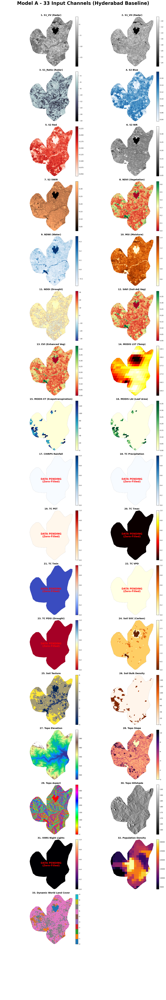

[*] Successfully saved physically-colored 33-band plot to /content/drive/MyDrive/FYP_Inference/Hyderabad_All_33_Bands_Colored.png


In [26]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# 1. Exact order of the 33 bands
band_names = [
    "S1_VV (Radar)", "S1_VH (Radar)", "S1_Ratio (Radar)",
    "S2 Blue", "S2 Red", "S2 NIR", "S2 SWIR",
    "NDVI (Vegetation)", "NDWI (Water)", "MSI (Moisture)", "NDDI (Drought)", "SAVI (Soil-Adj Veg)", "EVI (Enhanced Veg)",
    "MODIS LST (Temp)", "MODIS ET (Evapotranspiration)", "MODIS LAI (Leaf Area)",
    "CHIRPS Rainfall",
    "TC Precipitation", "TC PET", "TC Tmax", "TC Tmin", "TC VPD", "TC PDSI (Drought)",
    "Soil SOC (Carbon)", "Soil Texture", "Soil Bulk Density",
    "Topo Elevation", "Topo Slope", "Topo Aspect", "Topo Hillshade",
    "VIIRS Night Lights", "Population Density", "Dynamic World Land Cover"
]

# Scientifically mapped colormaps for each specific feature
colormaps = [
    "gray", "gray", "bone",                  # 1-3. Radar (Greyscale standard)
    "Blues", "Reds", "gray", "copper",       # 4-7. Optical bands
    "RdYlGn", "Blues", "YlOrBr", "RdYlBu_r", # 8-11. Veg/Water/Drought indices
    "RdYlGn", "RdYlGn",                      # 12-13. Veg indices
    "hot", "YlGnBu", "YlGn",                 # 14-16. LST (Heat), ET (Water), LAI (Veg)
    "Blues",                                 # 17. CHIRPS (Rain)
    "Blues", "OrRd", "hot", "coolwarm",      # 18-21. Climate (Precip, PET, Temp max/min)
    "YlOrBr", "RdYlBu",                      # 22-23. VPD, PDSI (Drought index)
    "YlOrBr_r", "cividis", "Oranges",        # 24-26. Soils (Brown/Earthy tones)
    "terrain", "magma_r", "hsv", "gray",     # 27-30. Topography (Aspect gets circular HSV)
    "magma", "inferno", "tab10"              # 31-33. Nightlights, Pop (Dark backgrounds), LC
]

# Update path if necessary
input_tiff = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"

print("[*] Loading GeoTIFF and processing 33 bands...")

with rasterio.open(input_tiff) as src:
    # CLEAN THE NANS IMMEDIATELY!
    blue = np.nan_to_num(src.read(4), nan=0.0)
    red  = np.nan_to_num(src.read(5), nan=0.0)

    # Create a global shape mask using the optical bands to hide the black padding
    global_mask = (blue == 0) & (red == 0)

    # Set up an 18x2 grid with plenty of vertical height
    fig, axes = plt.subplots(18, 2, figsize=(15, 90), facecolor='white')
    axes = axes.flatten()

    for i in range(33):
        # Rasterio bands are 1-indexed. CLEAN NANS HERE TOO!
        band_data = np.nan_to_num(src.read(i + 1), nan=0.0, posinf=0.0, neginf=0.0)

        # Apply the mask so the background is clean white
        masked_data = np.ma.masked_where(global_mask, band_data)

        # Grab only the valid pixels inside the district borders
        valid_pixels = band_data[~global_mask]

        ax = axes[i]
        cmap_to_use = colormaps[i]

        # Check if the fallback script triggered (i.e., the whole district is exactly 0.0)
        if len(valid_pixels) == 0 or np.all(valid_pixels == 0):
            vmin, vmax = 0, 1
            ax.text(0.5, 0.5, 'DATA PENDING\n(Zero-Filled)',
                    horizontalalignment='center', verticalalignment='center',
                    transform=ax.transAxes, color='red', fontsize=16, fontweight='bold')
        else:
            # Dynamic contrast stretch for visible features
            vmin, vmax = np.percentile(valid_pixels, (2, 98))
            if vmin == vmax:
                vmax = vmin + 1e-5

        # Plot the data
        if "Land Cover" in band_names[i]:
            im = ax.imshow(masked_data, cmap=cmap_to_use, vmin=0, vmax=9, interpolation='nearest')
        else:
            im = ax.imshow(masked_data, cmap=cmap_to_use, vmin=vmin, vmax=vmax)

        ax.set_title(f"{i+1}. {band_names[i]}", fontsize=14, fontweight='bold')
        ax.axis('off')

        # Add a small colorbar
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    # Turn off the empty remaining subplots (33, 34, 35)
    for j in range(33, 36):
        axes[j].axis('off')

# Title for the whole figure
fig.suptitle("Model A - 33 Input Channels (Hyderabad Baseline)", fontsize=30, fontweight='bold', y=0.995)

plt.tight_layout(rect=[0, 0, 1, 0.99])
output_path = "/content/drive/MyDrive/FYP_Inference/Hyderabad_All_33_Bands_Colored.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"[*] Successfully saved physically-colored 33-band plot to {output_path}")

[*] Loading and flattening valid pixels...
[*] Calculating pixel-wise feature importance...
[*] Generating Chart...


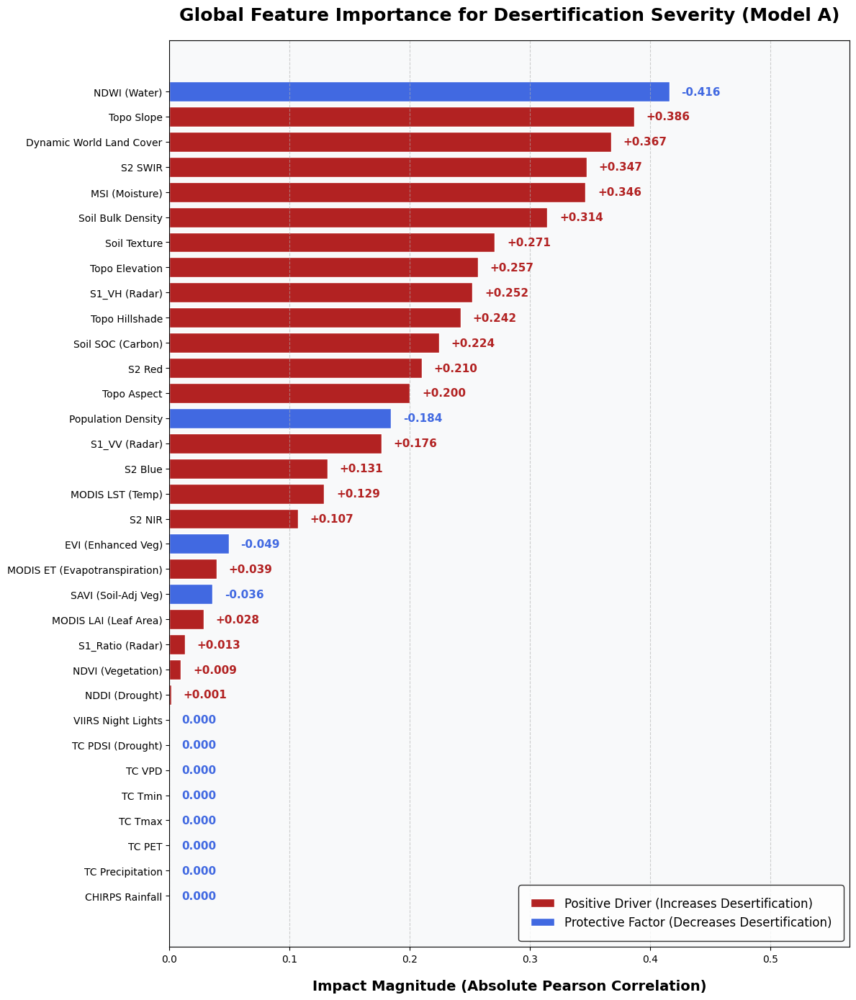

[*] Chart successfully saved to: /content/drive/MyDrive/FYP_Inference/Hyderabad_Feature_Importance.png


In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# --- 1. CONFIGURATION ---
input_tiff = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"
dsi_tiff   = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif"
output_chart = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Feature_Importance.png"

# The exact order of the 33 bands
band_names = [
    "S1_VV (Radar)", "S1_VH (Radar)", "S1_Ratio (Radar)",
    "S2 Blue", "S2 Red", "S2 NIR", "S2 SWIR",
    "NDVI (Vegetation)", "NDWI (Water)", "MSI (Moisture)", "NDDI (Drought)", "SAVI (Soil-Adj Veg)", "EVI (Enhanced Veg)",
    "MODIS LST (Temp)", "MODIS ET (Evapotranspiration)", "MODIS LAI (Leaf Area)",
    "CHIRPS Rainfall",
    "TC Precipitation", "TC PET", "TC Tmax", "TC Tmin", "TC VPD", "TC PDSI (Drought)",
    "Soil SOC (Carbon)", "Soil Texture", "Soil Bulk Density",
    "Topo Elevation", "Topo Slope", "Topo Aspect", "Topo Hillshade",
    "VIIRS Night Lights", "Population Density", "Dynamic World Land Cover"
]

# --- 2. LOAD DATA AND MASK ---
print("[*] Loading and flattening valid pixels...")

with rasterio.open(input_tiff) as src:
    # Use Blue and Red bands to find the valid district geometry (ignoring black padding)
    blue = np.nan_to_num(src.read(4), nan=0.0)
    red  = np.nan_to_num(src.read(5), nan=0.0)
    global_mask = (blue == 0) & (red == 0)

with rasterio.open(dsi_tiff) as src:
    dsi_data = src.read(1)
    dsi_valid = dsi_data[~global_mask]

# --- 3. CALCULATE CORRELATION (IMPORTANCE) ---
print("[*] Calculating pixel-wise feature importance...")
importances = []

with rasterio.open(input_tiff) as src:
    for i in range(33):
        # Read band and extract valid pixels
        band_data = np.nan_to_num(src.read(i + 1), nan=0.0, posinf=0.0, neginf=0.0)
        band_valid = band_data[~global_mask]

        # Calculate Pearson Correlation Coefficient
        # Ignore completely static bands (where standard deviation is 0) to avoid division by zero
        if np.std(band_valid) == 0:
            corr = 0.0
        else:
            corr = np.corrcoef(band_valid, dsi_valid)[0, 1]

        importances.append((band_names[i], corr))

# Sort by absolute magnitude (impact), regardless of whether it is positive or negative
importances.sort(key=lambda x: abs(x[1]), reverse=False)

# Separate back into lists for plotting
sorted_names = [x[0] for x in importances]
sorted_corrs = [x[1] for x in importances]
abs_corrs = [abs(x) for x in sorted_corrs]

# Determine colors: Red for Positive correlation (worsens DSI), Blue for Negative (improves DSI)
bar_colors = ['firebrick' if c > 0 else 'royalblue' for c in sorted_corrs]

# --- 4. PLOT THE BAR CHART ---
print("[*] Generating Chart...")
fig, ax = plt.subplots(figsize=(12, 14), facecolor='white')
ax.set_facecolor('#f8f9fa')

# Create horizontal bars representing absolute magnitude
bars = ax.barh(sorted_names, abs_corrs, color=bar_colors, edgecolor='white', height=0.8)

# Add value labels inside/next to the bars showing the actual +/- correlation
for i, bar in enumerate(bars):
    width = bar.get_width()
    actual_corr = sorted_corrs[i]
    sign = "+" if actual_corr > 0 else ""
    label = f"{sign}{actual_corr:.3f}"

    # Position text slightly right of the bar
    ax.text(width + 0.01, bar.get_y() + bar.get_height()/2, label,
            va='center', ha='left', fontsize=11, fontweight='bold', color=bar_colors[i])

# Formatting
ax.set_xlabel("Impact Magnitude (Absolute Pearson Correlation)", fontsize=14, fontweight='bold', labelpad=15)
ax.set_title("Global Feature Importance for Desertification Severity (Model A)", fontsize=18, fontweight='bold', pad=20)

# Custom legend to explain the colors
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='firebrick', edgecolor='white', label='Positive Driver (Increases Desertification)'),
    Patch(facecolor='royalblue', edgecolor='white', label='Protective Factor (Decreases Desertification)')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=12, frameon=True, edgecolor='black', borderpad=1)

# Grid and limits
ax.grid(axis='x', linestyle='--', alpha=0.6)
ax.set_xlim(0, max(abs_corrs) + 0.15) # Add padding for the text labels

plt.tight_layout()
plt.savefig(output_chart, dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print(f"[*] Chart successfully saved to: {output_chart}")

[*] Extracting valid pixels for Hexbin plot...
[*] Generating Hexbin Density Plot...


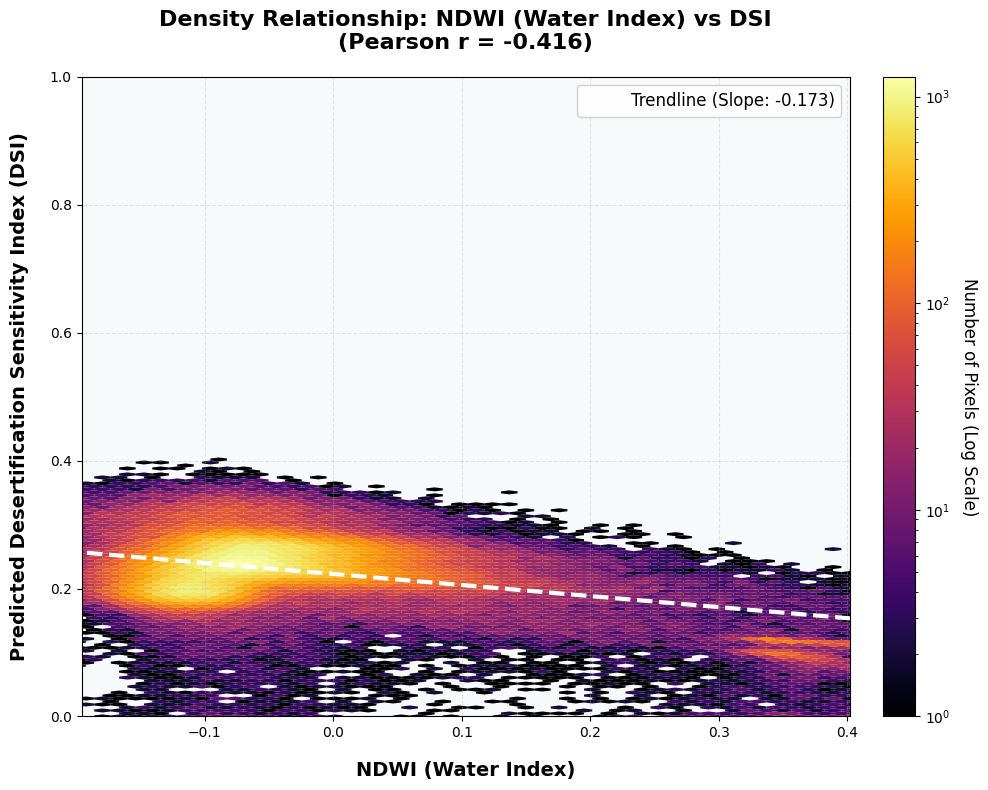

[*] Hexbin plot successfully saved to: /content/drive/MyDrive/FYP_Inference/Hyderabad_Hexbin_NDWI_vs_DSI.png


In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# --- 1. CONFIGURATION ---
input_tiff = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"
dsi_tiff   = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif"
output_hexbin = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Hexbin_NDWI_vs_DSI.png"

# Choose which feature to plot (Rasterio uses 1-based indexing)
# 8 = NDVI, 14 = LST, 17 = Rainfall, etc. (Check your band_names list!)
FEATURE_BAND = 9
FEATURE_NAME = "NDWI (Water Index)"

# --- 2. LOAD DATA AND MASK ---
print("[*] Extracting valid pixels for Hexbin plot...")

with rasterio.open(input_tiff) as src:
    # Use Blue and Red to find the valid district geometry
    blue = np.nan_to_num(src.read(4), nan=0.0)
    red  = np.nan_to_num(src.read(5), nan=0.0)
    global_mask = (blue == 0) & (red == 0)

    # Read the specific feature band
    feature_data = np.nan_to_num(src.read(FEATURE_BAND), nan=0.0, posinf=0.0, neginf=0.0)
    x_valid = feature_data[~global_mask]

with rasterio.open(dsi_tiff) as src:
    dsi_data = src.read(1)
    y_valid = dsi_data[~global_mask]

# Calculate correlation for the title
corr, _ = pearsonr(x_valid, y_valid)

# --- 3. PLOT THE HEXBIN ---
print("[*] Generating Hexbin Density Plot...")
fig, ax = plt.subplots(figsize=(10, 8), facecolor='white')
ax.set_facecolor('#f8f9fa')

# The magic hexbin function
# gridsize controls the size of the hexagons (higher = smaller hexes)
# bins='log' uses a logarithmic color scale so dense clusters don't wash out outliers
hb = ax.hexbin(x_valid, y_valid, gridsize=75, cmap='inferno', mincnt=1, bins='log', edgecolors='none')

# Add a linear regression line (Line of Best Fit)
z = np.polyfit(x_valid, y_valid, 1)
p = np.poly1d(z)
# Generate points for the line that span the actual data range
x_line = np.linspace(x_valid.min(), x_valid.max(), 100)
ax.plot(x_line, p(x_line), "w--", linewidth=3, label=f"Trendline (Slope: {z[0]:.3f})")

# --- 4. FORMATTING ---
ax.set_xlabel(FEATURE_NAME, fontsize=14, fontweight='bold', labelpad=15)
ax.set_ylabel("Predicted Desertification Sensitivity Index (DSI)", fontsize=14, fontweight='bold', labelpad=15)
ax.set_title(f"Density Relationship: {FEATURE_NAME} vs DSI\n(Pearson r = {corr:.3f})", fontsize=16, fontweight='bold', pad=20)

# Add a colorbar to explain the density
cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04)
cb.set_label('Number of Pixels (Log Scale)', rotation=270, labelpad=20, fontsize=12)

# Lock Y-axis to 0-1 since DSI is an index
ax.set_ylim(0, 1.0)
# Dynamic X-axis limits based on percentiles to ignore crazy outliers
ax.set_xlim(np.percentile(x_valid, 1), np.percentile(x_valid, 99))

ax.grid(True, linestyle='--', alpha=0.3)
ax.legend(loc='upper right', fontsize=12, framealpha=0.9)

plt.tight_layout()
plt.savefig(output_hexbin, dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print(f"[*] Hexbin plot successfully saved to: {output_hexbin}")

[*] Extracting valid pixels for Hexbin plot...
[*] Generating Hexbin Density Plot...


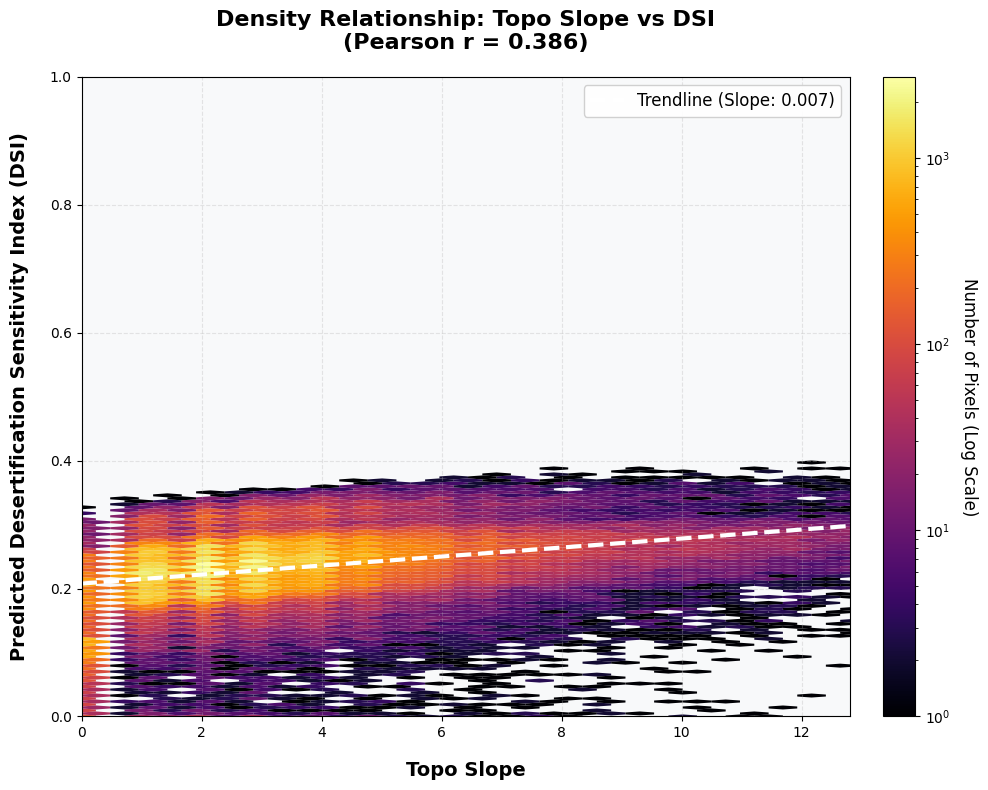

[*] Hexbin plot successfully saved to: /content/drive/MyDrive/FYP_Inference/Hyderabad_Hexbin_Topo_slope_vs_DSI.png


In [6]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# --- 1. CONFIGURATION ---
input_tiff = "/content/drive/MyDrive/FYP_Inference/Hyderabad_ModelA_Inputs_Feb2026.tif"
dsi_tiff   = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Predicted_DSI_Feb2026.tif"
output_hexbin = "/content/drive/MyDrive/FYP_Inference/Hyderabad_Hexbin_Topo_slope_vs_DSI.png"

# Choose which feature to plot (Rasterio uses 1-based indexing)
# 8 = NDVI, 14 = LST, 17 = Rainfall, etc. (Check your band_names list!)
FEATURE_BAND = 28
FEATURE_NAME = "Topo Slope"

# --- 2. LOAD DATA AND MASK ---
print("[*] Extracting valid pixels for Hexbin plot...")

with rasterio.open(input_tiff) as src:
    # Use Blue and Red to find the valid district geometry
    blue = np.nan_to_num(src.read(4), nan=0.0)
    red  = np.nan_to_num(src.read(5), nan=0.0)
    global_mask = (blue == 0) & (red == 0)

    # Read the specific feature band
    feature_data = np.nan_to_num(src.read(FEATURE_BAND), nan=0.0, posinf=0.0, neginf=0.0)
    x_valid = feature_data[~global_mask]

with rasterio.open(dsi_tiff) as src:
    dsi_data = src.read(1)
    y_valid = dsi_data[~global_mask]

# Calculate correlation for the title
corr, _ = pearsonr(x_valid, y_valid)

# --- 3. PLOT THE HEXBIN ---
print("[*] Generating Hexbin Density Plot...")
fig, ax = plt.subplots(figsize=(10, 8), facecolor='white')
ax.set_facecolor('#f8f9fa')

# The magic hexbin function
# gridsize controls the size of the hexagons (higher = smaller hexes)
# bins='log' uses a logarithmic color scale so dense clusters don't wash out outliers
hb = ax.hexbin(x_valid, y_valid, gridsize=75, cmap='inferno', mincnt=1, bins='log', edgecolors='none')

# Add a linear regression line (Line of Best Fit)
z = np.polyfit(x_valid, y_valid, 1)
p = np.poly1d(z)
# Generate points for the line that span the actual data range
x_line = np.linspace(x_valid.min(), x_valid.max(), 100)
ax.plot(x_line, p(x_line), "w--", linewidth=3, label=f"Trendline (Slope: {z[0]:.3f})")

# --- 4. FORMATTING ---
ax.set_xlabel(FEATURE_NAME, fontsize=14, fontweight='bold', labelpad=15)
ax.set_ylabel("Predicted Desertification Sensitivity Index (DSI)", fontsize=14, fontweight='bold', labelpad=15)
ax.set_title(f"Density Relationship: {FEATURE_NAME} vs DSI\n(Pearson r = {corr:.3f})", fontsize=16, fontweight='bold', pad=20)

# Add a colorbar to explain the density
cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04)
cb.set_label('Number of Pixels (Log Scale)', rotation=270, labelpad=20, fontsize=12)

# Lock Y-axis to 0-1 since DSI is an index
ax.set_ylim(0, 1.0)
# Dynamic X-axis limits based on percentiles to ignore crazy outliers
ax.set_xlim(np.percentile(x_valid, 1), np.percentile(x_valid, 99))

ax.grid(True, linestyle='--', alpha=0.3)
ax.legend(loc='upper right', fontsize=12, framealpha=0.9)

plt.tight_layout()
plt.savefig(output_hexbin, dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()

print(f"[*] Hexbin plot successfully saved to: {output_hexbin}")